# Алгоритм Гриффина - Лима





**Цель работы:** продемонстировать работу алгоритма Гриффина - Лима на речевом сигнале

**Этапы работы:**


1.   Записать свой голос средствами ОС
2.   Построить амплитудную спектрограмму записанного сигнала
3. Восстановить записанный речевой сигнал по его спектрограмме алгоритмом Гриффина - Лима

**Задачи работы:** исследовать зависимость качества преобразование от параметров алгоритма


### Реализация алгоритма

In [1]:
import librosa
import numpy as np
import scipy 
import scipy.fft
import IPython.display as ipd
import matplotlib.pyplot as plt
import librosa.display
import copy
from scipy import signal

**1. Предобработка**

Загрузим записанный речевой сигнал, вопроизведем и построим его

In [2]:
def draw_waveform(wav, sr, figsize=(14, 5), name=None):
    # Отрисовка звукового сигнала во временной области
    plt.figure(figsize=figsize)
    librosa.display.waveplot(wav, sr=sr)
    if name != None:
      plt.title(name)
    plt.show()

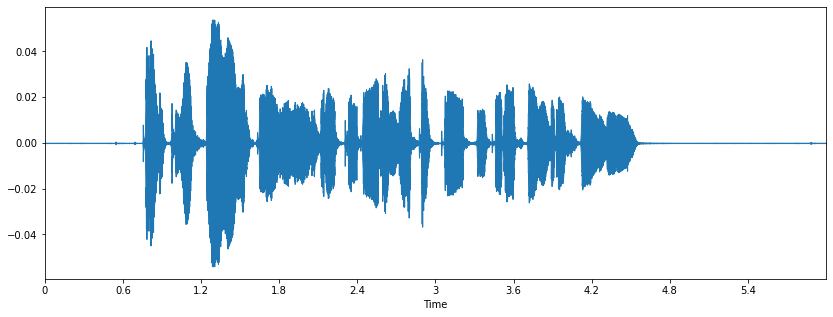

In [3]:
wav, sr = librosa.load("lab3_test.wav")
draw_waveform(wav, sr)
ipd.Audio(wav, rate=sr)

Обрезаем тишину по краям 

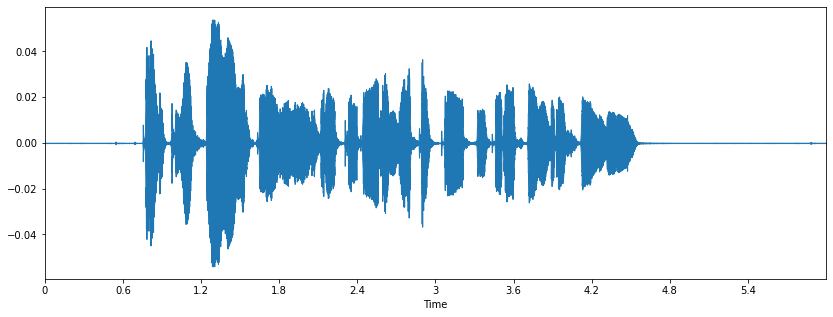

In [4]:
wav, _ = librosa.effects.trim(wav)
draw_waveform(wav, sr)

Применим фильтр усиления высоких частот

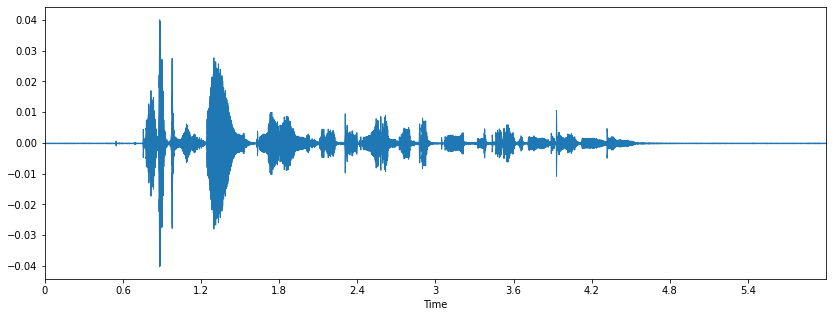

In [5]:
wav_filtered = np.append(wav[0], wav[1:]-0.97*wav[:-1])
draw_waveform(wav_filtered, sr)
ipd.Audio(wav_filtered, rate=sr)

**2. Вычисление спектрограммы**

Вычислим дискретное преобразование Фурье и построим спектрограмму.

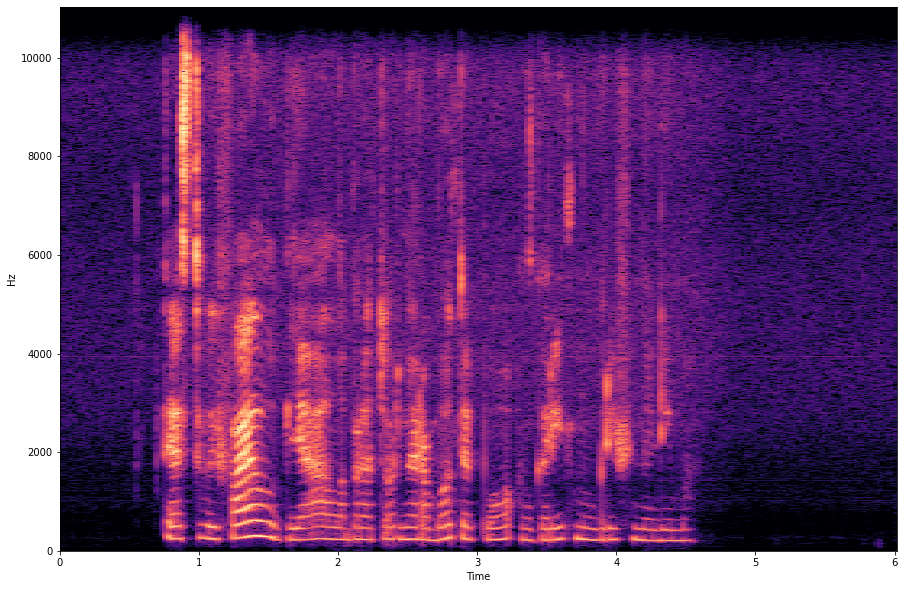

In [6]:
wav_stft = librosa.stft(wav_filtered)
D = np.abs(wav_stft)
stft_db = librosa.amplitude_to_db(D)
plt.figure(figsize=(15,10))
librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='hz')

**3. Алгоритм Гриффина - Лима**

Реализуем непосредственно сам алгоритм

In [7]:
def GriffinLim (spec, i_max = 50):
  # spec - amplitude spectrum of the signal
  # i_max - number of iteration
  D = copy.deepcopy(spec)
  for i in range(i_max):
    X_t = librosa.istft(D)
    E = librosa.stft(X_t)
    phase = E / np.abs(E)
    D = spec * phase
  X_t = librosa.istft(D)
  X_out = np.real(X_t)
  return X_out

In [8]:
wav_new_filt = GriffinLim(D)

**4. Постобработка**

In [9]:
wav_new = signal.lfilter([1], [1, -0.97], wav_new_filt)

Отрисуем и воспроизведем полученный сигнал

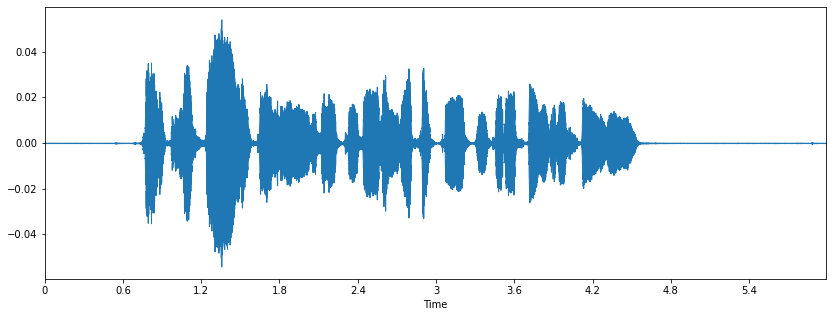

In [10]:
draw_waveform(wav_new, sr)
ipd.Audio(wav_new, rate=sr)

Полученная в результате работы алгоритма аудиозапись звучит несколько хуже оригинала, но содержательно полностью соотвествует ему.

### Исследование влияния гиперпараметров

Объединим все этапы в одну функцию, чтобы было удобнее задавать гиперпараметры

In [11]:
def GriffinLim(wav, a = 0.97, N = 2048, h = 512, i_max = 50):
  # wav - входной .wav файл
  # a - коэффициент фильтра усиления высоких частот
  # N - размерность дискретного преобразования Фурье
  # h - величина сдвига 
  # i_max - число итераций алогритма Гриффина-Лима

  # обрезаем тишину
  wav, _ = librosa.effects.trim(wav)

  # фильтр усиления высоких частот
  wav_filtered = np.append(wav[0], wav[1:]-a*wav[:-1])

  # вычисление спектрограммы
  wav_stft = librosa.stft(wav_filtered, n_fft = N, hop_length=h)
  spec = np.abs(wav_stft)

  # применение алгоритма Гриффина-Лима
  D = copy.deepcopy(spec)
  for i in range(i_max):
    X_t = librosa.istft(D, hop_length = h)
    E = librosa.stft(X_t, n_fft = N, hop_length = h)
    phase = E / np.abs(E)
    D = spec * phase
  X_t = librosa.istft(D)
  X_out = np.real(X_t)

  #постобработка
  wav_new = signal.lfilter([1], [1, -a], X_out)

  return wav_new

Оценку влияния параметров на качество преобразования будем производить на основе субъективного сравнения результрующих сигналов в сигналом - эталоном

**Зависимость качества преобразвания от параметра фильтра**

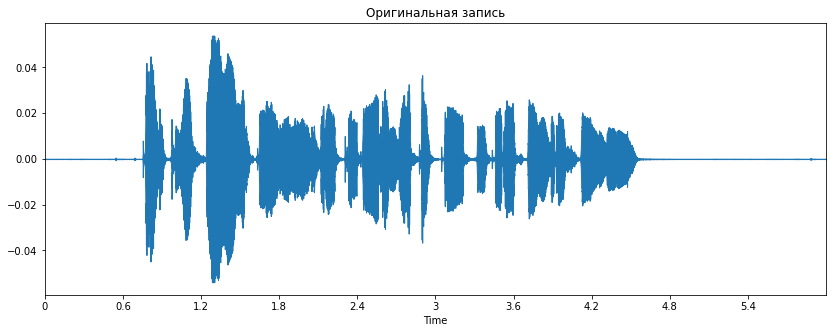

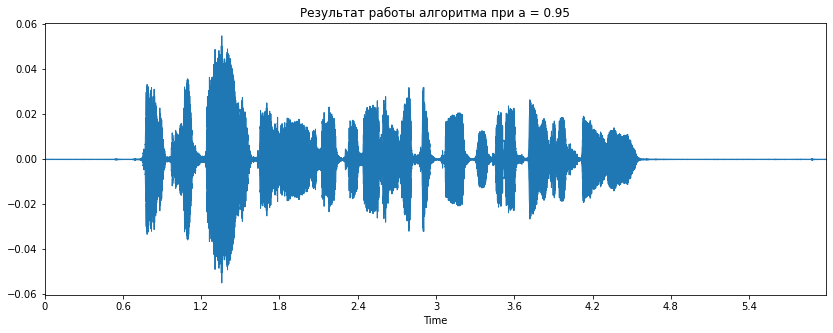

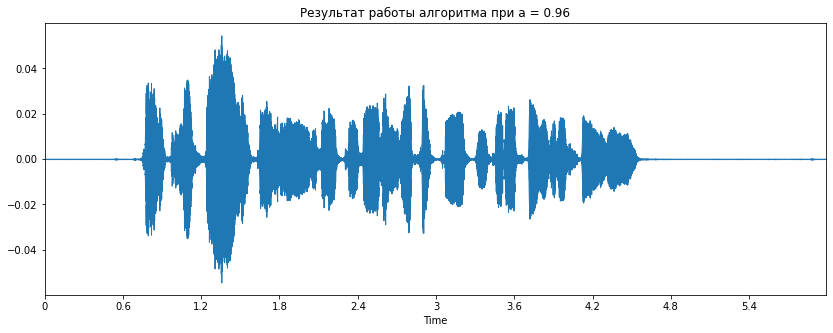

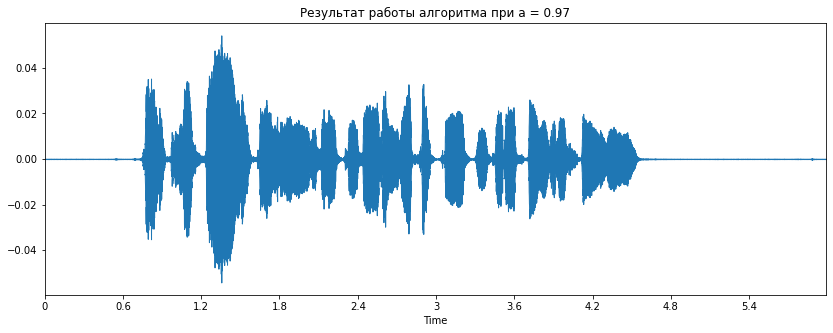

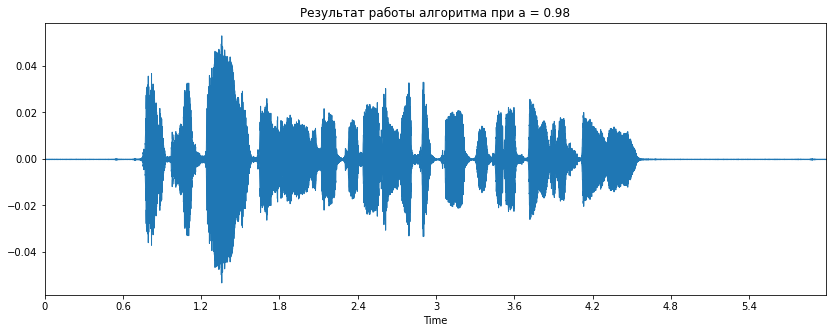

In [19]:
a = [0.95, 0.96, 0.97, 0.98]
draw_waveform(wav, sr,  name='Оригинальная запись')
display(ipd.Audio(wav, rate=sr))
for param in a:
  wav_new = GriffinLim(wav, a=param)
  draw_waveform(wav_new, sr,  name=f'Результат работы алгоритма при a = {param}')
  display(ipd.Audio(wav_new, rate=sr))

Полученные в результате изменения параметра фильтра сигналы не имеют значительных визульных и слуховых различий: сложно сказать, какое значение параметра лучше. Возможно, это связанно с тем, что используемый сигнал изначально был хорошо сбалансирован и имел хорошее отношение сигнал/шум, а также тем, что для эксперимента коэффициенты фильтра были выбраны из рекомендуемого диапазона.

**Зависимость качества преобразвания от размерности ДПФ**

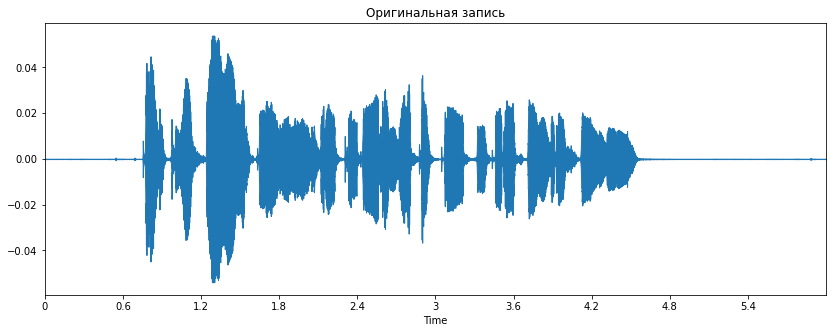

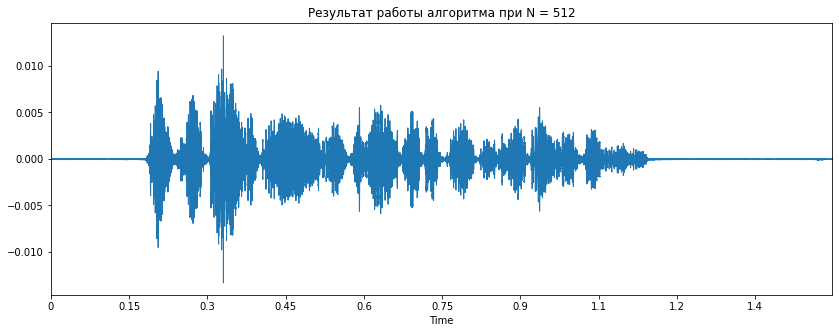

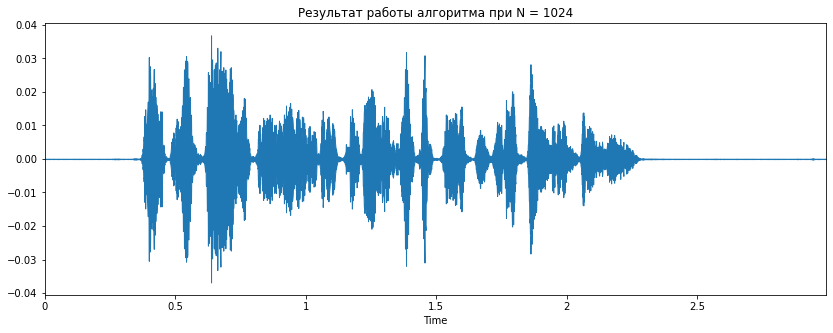

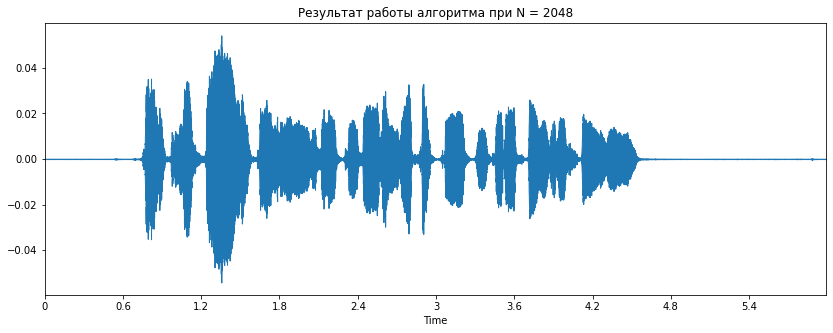

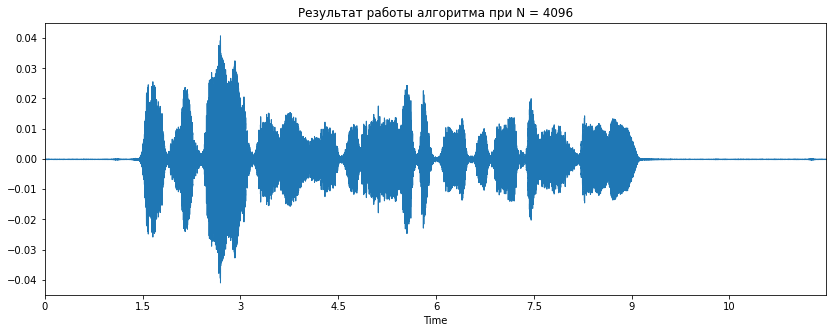

In [20]:
N = [512, 1024, 2048, 4096]
draw_waveform(wav, sr,  name='Оригинальная запись')
display(ipd.Audio(wav, rate=sr))
for param in N:
  wav_new = GriffinLim(wav, N = param, h = 512)
  draw_waveform(wav_new, sr, name=f'Результат работы алгоритма при N = {param}')
  display(ipd.Audio(wav_new, rate=sr))

Наиболее близкий к оригиналу по звучанию вариант был получен в результате применения алгоритма с размерностью ДПФ = 2048. Остальные слишком сжаты или, наоборот, растянуты по времени. Это может быть связано с тем, что при изменении размерности ДПФ размер сдвига оставался прежним и не являлся оптимальным для значений N!=2048



Попробуем менять размер окна прпорционально размерности ДПФ

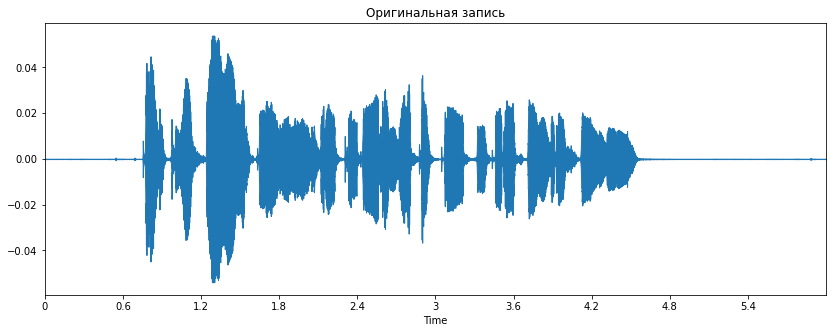

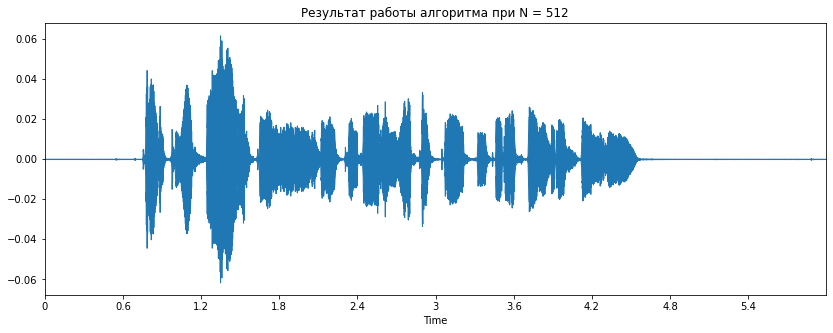

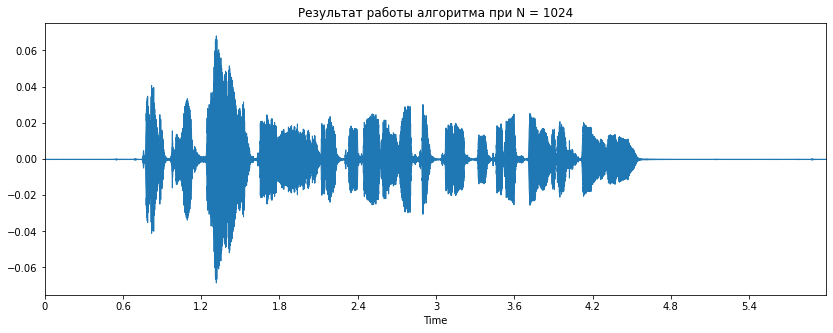

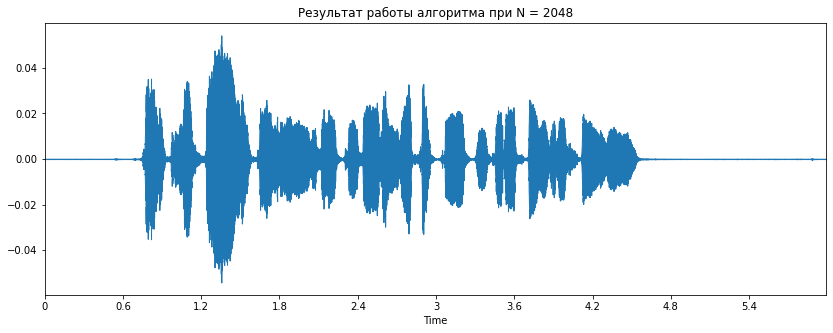

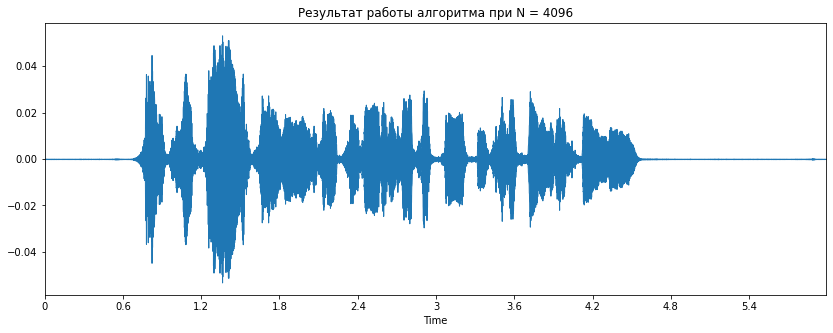

In [24]:
N = [512, 1024, 2048, 4096]
draw_waveform(wav, sr,  name='Оригинальная запись')
display(ipd.Audio(wav, rate=sr))
for param in N:
  wav_new = GriffinLim(wav, N = param, h = param//4)
  draw_waveform(wav_new, sr, name=f'Результат работы алгоритма при N = {param}')
  display(ipd.Audio(wav_new, rate=sr))

В таком варианте набиолее близкими к оригинальному звучания получились записи со значениями N = 1024 и N = 2048. При остальных значениях N на записях появляется эхо (наиболее отчетливо можно услышать на записи при N=4096).

**Зависимость качества преобразвания от величины сдвига**

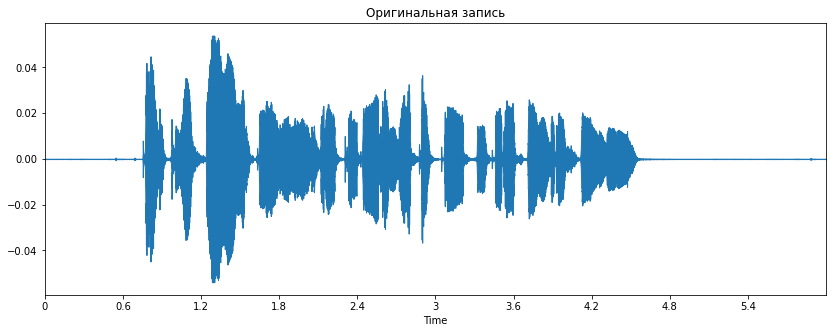

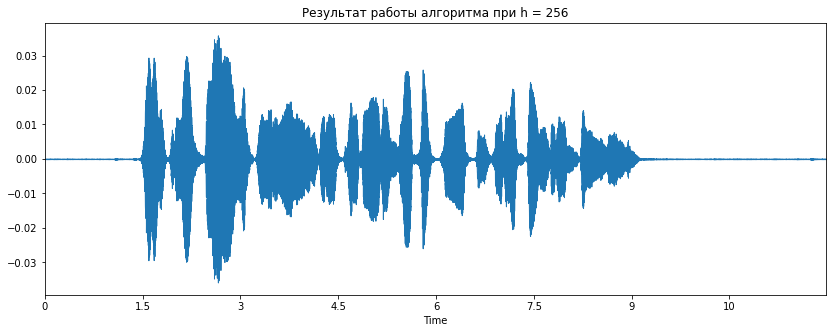

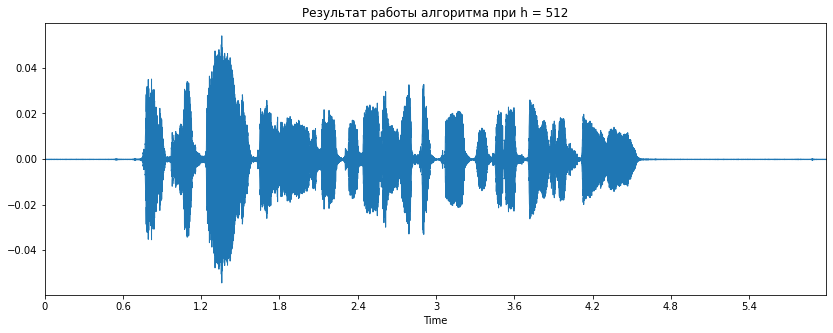

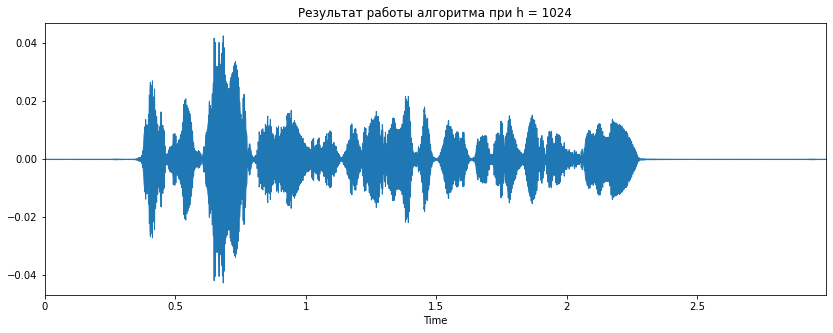

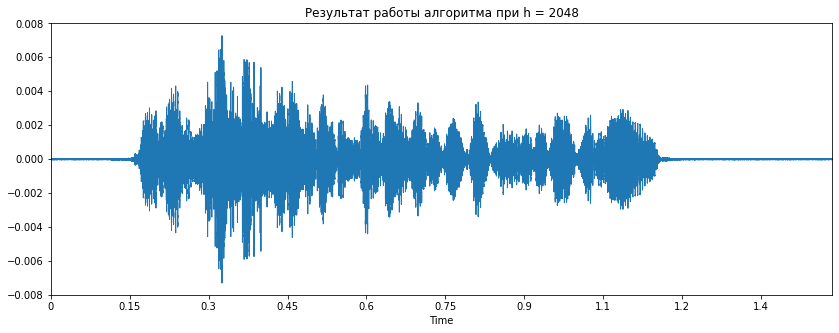

In [21]:
N = 2048
h = [N//8, N//4, N//2, N]
draw_waveform(wav, sr,  name='Оригинальная запись')
display(ipd.Audio(wav, rate=sr))
for param in h:
  wav_new = GriffinLim(wav, N = N, h = param)
  draw_waveform(wav_new, sr, name=f'Результат работы алгоритма при h = {param}')
  display(ipd.Audio(wav_new, rate=sr))

Наилучший результат работы алгоритм показал при значении величины сдвига равной 512, что соотвествует значению h = N//4. При значениях меньше данной сгенерированная речь получалась слишком медленной, при значениях больше, наоборот, ускоренной.

**Зависимость качества преобразвания от числа итераций**

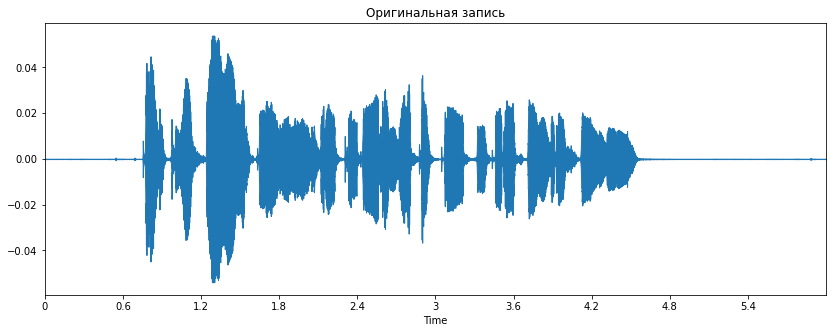

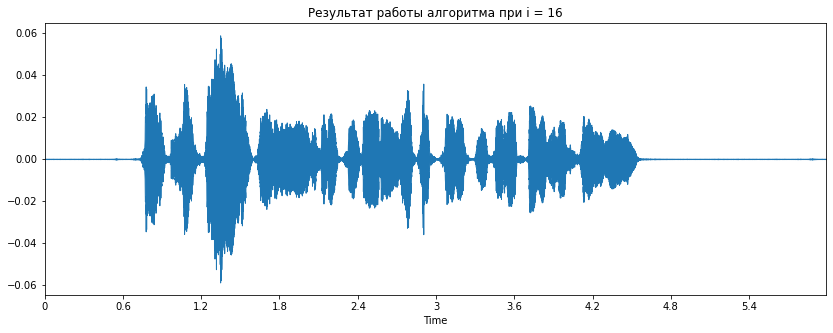

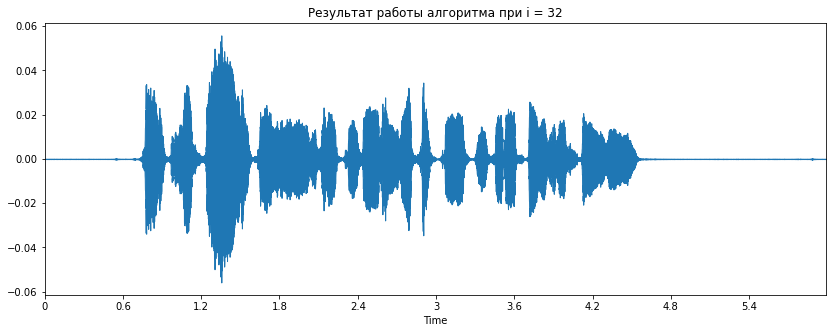

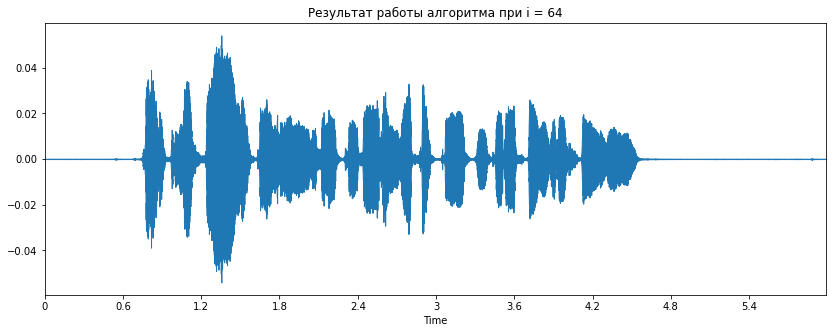

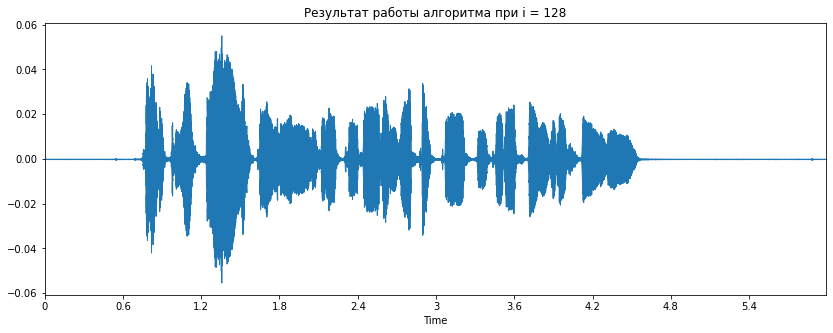

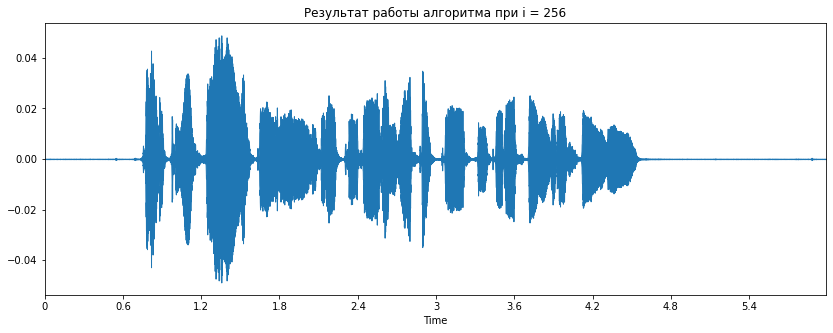

In [22]:
i = [16, 32, 64, 128, 256]
draw_waveform(wav, sr,  name='Оригинальная запись')
display(ipd.Audio(wav, rate=sr))
for param in i:
  wav_new = GriffinLim(wav, i_max = param)
  draw_waveform(wav_new, sr, name=f'Результат работы алгоритма при i = {param}')
  display(ipd.Audio(wav_new, rate=sr))

По звучанию и визуальному представлению можно сказать, что результаты работы алгоритма улучшаются с увеличением числа итераций, однако при больших значениях i эти улучшения практически незаметны и можно предположить, что с дальнешим уеличением этого параметра результаты не будут существенно отличаться друг от друга. При этом стоит заметить, что уже при i = 16 можно получить разборчиваю речь повторяющую оригинал.